In [1]:
from lightgbm import LGBMRegressor, early_stopping, log_evaluation
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import optuna
import warnings
import json

In [2]:
warnings.filterwarnings('ignore')

# Dataset selection
dataset_map = {'1': 'Energy', '2': 'Stock', '3': 'Traffic', '4': 'Weather'}
dataset_choice = input("Select dataset (1. Energy 2. Stock 3. Traffic 4. Weather): ")
selected_dataset = dataset_map.get(dataset_choice)

Select dataset (1. Energy 2. Stock 3. Traffic 4. Weather):  2


In [6]:
base_models = ['LSTM', 'Transformer', 'LiquidML', 'XGBoost']
selected_models = [model for model in base_models if input(f"Include {model}? (y/n): ").lower() == 'y']

dataset_files = {
    'Energy': '../datasets/AEP_hourly_processed.xlsx',
    'Stock': '../datasets/Tesla_Stock.xlsx',
    'Traffic': '../datasets/traffic.xlsx',
    'Weather': '../datasets/jena_climate.xlsx'
}

selected_file = dataset_files[selected_dataset]

Include LSTM? (y/n):  y
Include Transformer? (y/n):  y
Include LiquidML? (y/n):  y
Include XGBoost? (y/n):  y


In [7]:
def split_target_series(y):
    split_idx = int(len(y) * 0.8)
    return y[:split_idx], y[split_idx:]

In [8]:
X_train_meta, X_test_meta = [], []

for model in selected_models:
    X_train_meta.append(np.load(f"../{model}/predictions/{selected_dataset}_{model}_train.npy").reshape(-1))
    X_test_meta.append(np.load(f"../{model}/predictions/{selected_dataset}_{model}_test.npy").reshape(-1))

X_train_meta = np.stack(X_train_meta, axis=1)
X_test_meta = np.stack(X_test_meta, axis=1)

scaler = StandardScaler()
X_train_meta_scaled = scaler.fit_transform(X_train_meta)
X_test_meta_scaled = scaler.transform(X_test_meta)

In [9]:
df = pd.read_excel(selected_file)
if selected_dataset == "Energy":
    target_column = "AEP_MW"
    df = df.iloc[:5000]
elif selected_dataset == "Stock":
    target_column = "Close"
    df = df.iloc[-2000:]
elif selected_dataset == "Traffic":
    target_column = "Vehicles"
    df = df.iloc[-3000:]
else:
    target_column = "Tpot (K)"
    df = df.iloc[::144]

full_target = df[target_column].values
split_idx = int(len(full_target) * 0.8)
y_train = full_target[:split_idx][60:]
y_test = full_target[split_idx:][60:]

In [10]:
X = X_train_meta_scaled
y = y_train
n_splits = 5
initial_train_size = int(len(X) * 0.5)
test_size = int((len(X) - initial_train_size) / n_splits)
oof_preds = np.zeros(len(y))
oof_indices = []

for i in range(n_splits):
    start = initial_train_size + i * test_size
    end = start + test_size
    if end > len(X): break

    X_train_fold, y_train_fold = X[:start], y[:start]
    X_valid_fold, y_valid_fold = X[start:end], y[start:end]

    model = LGBMRegressor(n_estimators=100, learning_rate=0.05, max_depth=3,
                          reg_alpha=0.5, reg_lambda=1.0, subsample=0.8,
                          colsample_bytree=0.8, random_state=42)
    model.fit(X_train_fold, y_train_fold)
    preds = model.predict(X_valid_fold)

    oof_preds[start:end] = preds
    oof_indices.extend(range(start, end))

rmse_oof = mean_squared_error(y[oof_indices], oof_preds[oof_indices], squared=False)
print(f"OOF Meta RMSE: {rmse_oof:.4f}")

  File "C:\Users\naman\anaconda3\Lib\site-packages\joblib\externals\loky\backend\context.py", line 257, in _count_physical_cores
    cpu_info = subprocess.run(
               ^^^^^^^^^^^^^^^
  File "C:\Users\naman\anaconda3\Lib\subprocess.py", line 548, in run
    with Popen(*popenargs, **kwargs) as process:
         ^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\naman\anaconda3\Lib\subprocess.py", line 1026, in __init__
    self._execute_child(args, executable, preexec_fn, close_fds,
  File "C:\Users\naman\anaconda3\Lib\subprocess.py", line 1538, in _execute_child
    hp, ht, pid, tid = _winapi.CreateProcess(executable, args,
                       ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000330 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1009
[LightGBM] [Info] Number of data points in the train set: 770, number of used features: 4
[LightGBM] [Info] Start training from score 19.199796
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

In [11]:
def objective(trial):
    params = {
        "n_estimators": 2000,
        "learning_rate": trial.suggest_loguniform("learning_rate", 1e-3, 0.1),
        "num_leaves": trial.suggest_int("num_leaves", 32, 128),
        "max_depth": trial.suggest_int("max_depth", 6, 10),
        "min_child_samples": trial.suggest_int("min_child_samples", 10, 100),
        "subsample": trial.suggest_uniform("subsample", 0.5, 1.0),
        "colsample_bytree": trial.suggest_uniform("colsample_bytree", 0.5, 1.0),
        "reg_alpha": trial.suggest_loguniform("reg_alpha", 1e-4, 20.0),
        "reg_lambda": trial.suggest_loguniform("reg_lambda", 1e-4, 20.0),
        "random_state": 42
    }
    model = LGBMRegressor(**params)
    model.fit(X_train_meta_scaled, y_train,
              eval_set=[(X_test_meta_scaled, y_test)],
              eval_metric="rmse",
              callbacks=[early_stopping(100), log_evaluation(period=0)])
    preds = model.predict(X_test_meta_scaled)
    return mean_squared_error(y_test, preds, squared=False)

study = optuna.create_study(direction="minimize")
study.optimize(objective, n_trials=200)

[I 2025-05-31 01:31:43,746] A new study created in memory with name: no-name-f01aeaa3-4e93-4857-a8ff-f2879f4115a7


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001361 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 91.403499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[I 2025-05-31 01:31:44,047] Trial 0 finished with value: 13.570448000267646 and parameters: {'learning_rate': 0.03852896916396717, 'num_leaves': 46, 'max_depth': 7, 'min_child_samples': 40, 'subsample': 0.8444955370449687, 'colsample_bytree': 0.9888140481337362, 'reg_alpha': 0.00020796133635770365, 'reg_lambda': 0.008292710804793386}. Best is trial 0 with value: 13.570448000267646.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:31:44,537] Trial 1 finished with value: 12.755409659702641 and parameters: {'learning_rate': 0.007064821946275509, 'num_leaves': 88, 'max_depth': 9, 'min_child_samples': 43, 'subsample': 0.7478960288422015, 'colsample_bytree': 0.7697908817000021, 'reg_alpha': 0.00021586791278338705, 'reg_lambda': 0.004956862411349487}. Best is trial 1 with value: 12.755409659702641.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:31:45,322] Trial 2 finished with value: 14.305959946630118 and parameters: {'learning_rate': 0.0030719013666798177, 'num_leaves': 126, 'max_depth': 10, 'min_child_samples': 99, 'subsample': 0.9994876766858332, 'colsample_bytree': 0.7023910256060093, 'reg_alpha': 0.15272123641414345, 'reg_lambda': 0.00021037606854721645}. Best is trial 1 with value: 12.755409659702641.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:31:46,325] Trial 3 finished with value: 15.785669090252325 and parameters: {'learning_rate': 0.0011287680652676895, 'num_leaves': 124, 'max_depth': 7, 'min_child_samples': 96, 'subsample': 0.6894654881328836, 'colsample_bytree': 0.5982519141145843, 'reg_alpha': 0.055981434281855695, 'reg_lambda': 11.515727850151608}. Best is trial 1 with value: 12.755409659702641.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000175 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 91.403499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[I 2025-05-31 01:31:46,624] Trial 4 finished with value: 13.930693689403032 and parameters: {'learning_rate': 0.0054361398198367735, 'num_leaves': 44, 'max_depth': 10, 'min_child_samples': 95, 'subsample': 0.8044659021166022, 'colsample_bytree': 0.8106568354313755, 'reg_alpha': 0.07212386821842637, 'reg_lambda': 0.923413020005027}. Best is trial 1 with value: 12.755409659702641.
[I 2025-05-31 01:31:46,717] Trial 5 finished with value: 11.317418311448947 and parameters: {'learning_rate': 0.06901042802357653, 'num_leaves': 36, 'max_depth': 6, 'min_child_samples': 29, 'subsample': 0.7591270090296991, 'colsample_bytree': 0.5277275037789282, 'reg_alpha': 0.005615834295995858, 'reg_lambda': 0.00016217347693223486}. Best is trial 5 with value: 11.317418311448947.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:31:47,630] Trial 6 finished with value: 14.657667107715008 and parameters: {'learning_rate': 0.0012286801467144802, 'num_leaves': 62, 'max_depth': 7, 'min_child_samples': 53, 'subsample': 0.8680228453297804, 'colsample_bytree': 0.8742009340938589, 'reg_alpha': 17.234638710186, 'reg_lambda': 1.110086029993204}. Best is trial 5 with value: 11.317418311448947.
[I 2025-05-31 01:31:47,787] Trial 7 finished with value: 13.593784132120817 and parameters: {'learning_rate': 0.060030659301288224, 'num_leaves': 49, 'max_depth': 6, 'min_child_samples': 60, 'subsample': 0.8766303951959138, 'colsample_bytree': 0.9715387812219848, 'reg_alpha': 0.0005281339849525406, 'reg_lambda': 5.666273428815087}. Best is trial 5 with value: 11.317418311448947.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000199 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 91.403499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[I 2025-05-31 01:31:47,901] Trial 8 finished with value: 10.982616290123186 and parameters: {'learning_rate': 0.054403614374054436, 'num_leaves': 68, 'max_depth': 10, 'min_child_samples': 35, 'subsample': 0.5885587501896321, 'colsample_bytree': 0.6145586512239358, 'reg_alpha': 0.0031517977641879473, 'reg_lambda': 0.12192885564823527}. Best is trial 8 with value: 10.982616290123186.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:31:48,040] Trial 9 finished with value: 13.385316089820813 and parameters: {'learning_rate': 0.023936538616191452, 'num_leaves': 64, 'max_depth': 7, 'min_child_samples': 31, 'subsample': 0.6997625833540303, 'colsample_bytree': 0.9785634400561406, 'reg_alpha': 0.8704854956353364, 'reg_lambda': 0.0001806278226030127}. Best is trial 8 with value: 10.982616290123186.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000132 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 91.403499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[I 2025-05-31 01:31:48,368] Trial 10 finished with value: 12.432591127129294 and parameters: {'learning_rate': 0.01991004487867249, 'num_leaves': 92, 'max_depth': 9, 'min_child_samples': 15, 'subsample': 0.5198559641270337, 'colsample_bytree': 0.6508845645765738, 'reg_alpha': 0.005030845313820751, 'reg_lambda': 0.07078144130099108}. Best is trial 8 with value: 10.982616290123186.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:31:48,575] Trial 11 finished with value: 11.110704577191184 and parameters: {'learning_rate': 0.09118804795240898, 'num_leaves': 34, 'max_depth': 6, 'min_child_samples': 15, 'subsample': 0.5708338480875624, 'colsample_bytree': 0.5144318747760624, 'reg_alpha': 0.0033854270004616484, 'reg_lambda': 0.07533466150255431}. Best is trial 8 with value: 10.982616290123186.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:31:48,754] Trial 12 finished with value: 11.032185670463209 and parameters: {'learning_rate': 0.07646356353413081, 'num_leaves': 71, 'max_depth': 8, 'min_child_samples': 12, 'subsample': 0.5467064038641629, 'colsample_bytree': 0.5143711202300476, 'reg_alpha': 0.003391938202344851, 'reg_lambda': 0.09878064970199436}. Best is trial 8 with value: 10.982616290123186.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:31:49,029] Trial 13 finished with value: 11.035139051493651 and parameters: {'learning_rate': 0.022666954599707197, 'num_leaves': 74, 'max_depth': 8, 'min_child_samples': 12, 'subsample': 0.6087916053846525, 'colsample_bytree': 0.5950286709661201, 'reg_alpha': 0.0011222507086958065, 'reg_lambda': 0.19781587792153818}. Best is trial 8 with value: 10.982616290123186.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:31:49,220] Trial 14 finished with value: 10.716170270640772 and parameters: {'learning_rate': 0.03867449058047799, 'num_leaves': 105, 'max_depth': 9, 'min_child_samples': 71, 'subsample': 0.6125968037823324, 'colsample_bytree': 0.586229474349631, 'reg_alpha': 0.013059270757507018, 'reg_lambda': 0.00808293088266878}. Best is trial 14 with value: 10.716170270640772.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:31:49,521] Trial 15 finished with value: 12.38754246620063 and parameters: {'learning_rate': 0.013439200113850896, 'num_leaves': 106, 'max_depth': 9, 'min_child_samples': 72, 'subsample': 0.6199726468956241, 'colsample_bytree': 0.6542110232623908, 'reg_alpha': 0.015664399475993098, 'reg_lambda': 0.004500080104663981}. Best is trial 14 with value: 10.716170270640772.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:31:49,680] Trial 16 finished with value: 10.692537368796996 and parameters: {'learning_rate': 0.04142609716492721, 'num_leaves': 109, 'max_depth': 10, 'min_child_samples': 77, 'subsample': 0.6463927528270755, 'colsample_bytree': 0.5918090830662364, 'reg_alpha': 0.4418459632790946, 'reg_lambda': 0.0009689385615325547}. Best is trial 16 with value: 10.692537368796996.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000171 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 91.403499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[I 2025-05-31 01:31:49,828] Trial 17 finished with value: 12.608958629251637 and parameters: {'learning_rate': 0.03810714784035246, 'num_leaves': 109, 'max_depth': 9, 'min_child_samples': 79, 'subsample': 0.6502114628422025, 'colsample_bytree': 0.7141868298830307, 'reg_alpha': 1.1223356314950732, 'reg_lambda': 0.0010536133871669406}. Best is trial 16 with value: 10.692537368796996.
[I 2025-05-31 01:31:50,054] Trial 18 finished with value: 11.300194730720515 and parameters: {'learning_rate': 0.011260403888740047, 'num_leaves': 109, 'max_depth': 10, 'min_child_samples': 80, 'subsample': 0.6644349611465508, 'colsample_bytree': 0.556342122521617, 'reg_alpha': 0.3958616575176859, 'reg_lambda': 0.001103228287019748}. Best is trial 16 with value: 10.692537368796996.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000121 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 91.403499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[I 2025-05-31 01:31:50,272] Trial 19 finished with value: 12.41157288201716 and parameters: {'learning_rate': 0.031316019529701776, 'num_leaves': 99, 'max_depth': 9, 'min_child_samples': 66, 'subsample': 0.5041365371007509, 'colsample_bytree': 0.6716847414213012, 'reg_alpha': 5.58118760583294, 'reg_lambda': 0.015847551959511243}. Best is trial 16 with value: 10.692537368796996.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000253 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 91.403499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[I 2025-05-31 01:31:50,517] Trial 20 finished with value: 13.557451156223086 and parameters: {'learning_rate': 0.01506984659771489, 'num_leaves': 90, 'max_depth': 10, 'min_child_samples': 86, 'subsample': 0.7098687436482065, 'colsample_bytree': 0.7725396383437856, 'reg_alpha': 0.029371103093932163, 'reg_lambda': 0.0009883931138234194}. Best is trial 16 with value: 10.692537368796996.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000159 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 91.403499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[I 2025-05-31 01:31:50,679] Trial 21 finished with value: 11.000668752468115 and parameters: {'learning_rate': 0.05579830058225438, 'num_leaves': 117, 'max_depth': 10, 'min_child_samples': 58, 'subsample': 0.5933199997518238, 'colsample_bytree': 0.5955591062280771, 'reg_alpha': 0.18441718647888736, 'reg_lambda': 0.02240460061856538}. Best is trial 16 with value: 10.692537368796996.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000179 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 91.403499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[I 2025-05-31 01:31:50,846] Trial 22 finished with value: 10.715514502725291 and parameters: {'learning_rate': 0.04408399508858108, 'num_leaves': 82, 'max_depth': 10, 'min_child_samples': 72, 'subsample': 0.6283780548149993, 'colsample_bytree': 0.5673537358000508, 'reg_alpha': 0.001126432523848851, 'reg_lambda': 0.0028876889089198042}. Best is trial 16 with value: 10.692537368796996.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:31:51,006] Trial 23 finished with value: 10.725195153744522 and parameters: {'learning_rate': 0.03833306535201205, 'num_leaves': 82, 'max_depth': 9, 'min_child_samples': 69, 'subsample': 0.6393479370639692, 'colsample_bytree': 0.5577533624622404, 'reg_alpha': 0.014142975923387719, 'reg_lambda': 0.0022236979605355115}. Best is trial 16 with value: 10.692537368796996.
[I 2025-05-31 01:31:51,205] Trial 24 finished with value: 11.92118676879298 and parameters: {'learning_rate': 0.09620554963631878, 'num_leaves': 99, 'max_depth': 10, 'min_child_samples': 85, 'subsample': 0.739394267308395, 'colsample_bytree': 0.5661678767591667, 'reg_alpha': 0.0006837412272138557, 'reg_lambda': 0.0005083221854284358}. Best is trial 16 with value: 10.692537368796996.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000164 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 91.403499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[I 2025-05-31 01:31:51,552] Trial 25 finished with value: 12.621160043168935 and parameters: {'learning_rate': 0.007551864507120706, 'num_leaves': 116, 'max_depth': 9, 'min_child_samples': 74, 'subsample': 0.5453729981017715, 'colsample_bytree': 0.6266911343321816, 'reg_alpha': 1.8980132462719563, 'reg_lambda': 0.002583279280069068}. Best is trial 16 with value: 10.692537368796996.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:31:51,762] Trial 26 finished with value: 12.608284186496455 and parameters: {'learning_rate': 0.03199587529257715, 'num_leaves': 100, 'max_depth': 8, 'min_child_samples': 50, 'subsample': 0.6654183858596918, 'colsample_bytree': 0.6950546833012471, 'reg_alpha': 0.0011109384232678044, 'reg_lambda': 0.016924648901981216}. Best is trial 16 with value: 10.692537368796996.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:31:52,108] Trial 27 finished with value: 11.372358444780769 and parameters: {'learning_rate': 0.017148414153445347, 'num_leaves': 116, 'max_depth': 10, 'min_child_samples': 64, 'subsample': 0.5552277280976327, 'colsample_bytree': 0.5571724455859384, 'reg_alpha': 0.013026917363227409, 'reg_lambda': 0.0005304517785075264}. Best is trial 16 with value: 10.692537368796996.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:31:52,293] Trial 28 finished with value: 12.836697125587913 and parameters: {'learning_rate': 0.04811905424226171, 'num_leaves': 81, 'max_depth': 9, 'min_child_samples': 86, 'subsample': 0.6229210936702478, 'colsample_bytree': 0.7315831721528939, 'reg_alpha': 0.14243690615706447, 'reg_lambda': 0.029619495837552218}. Best is trial 16 with value: 10.692537368796996.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000152 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 91.403499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[I 2025-05-31 01:31:52,585] Trial 29 finished with value: 12.32611456647972 and parameters: {'learning_rate': 0.027147647427773786, 'num_leaves': 57, 'max_depth': 10, 'min_child_samples': 77, 'subsample': 0.7958623218904891, 'colsample_bytree': 0.8322438951709289, 'reg_alpha': 0.00010165945850582461, 'reg_lambda': 0.006118498108170331}. Best is trial 16 with value: 10.692537368796996.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:31:52,743] Trial 30 finished with value: 13.52732524687125 and parameters: {'learning_rate': 0.042513029593837445, 'num_leaves': 94, 'max_depth': 8, 'min_child_samples': 92, 'subsample': 0.7173767642187133, 'colsample_bytree': 0.6371372998297138, 'reg_alpha': 0.4290276221245615, 'reg_lambda': 0.01000331329964224}. Best is trial 16 with value: 10.692537368796996.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000147 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 91.403499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[I 2025-05-31 01:31:52,897] Trial 31 finished with value: 10.762972868791667 and parameters: {'learning_rate': 0.03682611300511969, 'num_leaves': 79, 'max_depth': 9, 'min_child_samples': 68, 'subsample': 0.6509747434072056, 'colsample_bytree': 0.5513965188655581, 'reg_alpha': 0.01498175228902966, 'reg_lambda': 0.0022307591352457874}. Best is trial 16 with value: 10.692537368796996.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:31:53,107] Trial 32 finished with value: 10.718093268890126 and parameters: {'learning_rate': 0.039690144100972435, 'num_leaves': 104, 'max_depth': 9, 'min_child_samples': 72, 'subsample': 0.6358277535443471, 'colsample_bytree': 0.5008430140531851, 'reg_alpha': 0.029650841409681584, 'reg_lambda': 0.0025519436191378895}. Best is trial 16 with value: 10.692537368796996.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:31:53,306] Trial 33 finished with value: 11.051008345754246 and parameters: {'learning_rate': 0.028348504651955365, 'num_leaves': 107, 'max_depth': 9, 'min_child_samples': 47, 'subsample': 0.6781856314726606, 'colsample_bytree': 0.5020795748852128, 'reg_alpha': 0.03527812430907745, 'reg_lambda': 0.0003373442591101896}. Best is trial 16 with value: 10.692537368796996.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:31:53,902] Trial 34 finished with value: 11.518285502688256 and parameters: {'learning_rate': 0.0040820651639206, 'num_leaves': 121, 'max_depth': 10, 'min_child_samples': 61, 'subsample': 0.9600559096801322, 'colsample_bytree': 0.5759351258232265, 'reg_alpha': 0.11821397972496506, 'reg_lambda': 0.005801756528130818}. Best is trial 16 with value: 10.692537368796996.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000125 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 91.403499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[I 2025-05-31 01:31:55,051] Trial 35 finished with value: 10.935434174329828 and parameters: {'learning_rate': 0.0017388079882713432, 'num_leaves': 127, 'max_depth': 10, 'min_child_samples': 74, 'subsample': 0.588027906050661, 'colsample_bytree': 0.5254924956400105, 'reg_alpha': 0.00030329306286159825, 'reg_lambda': 0.003039248082668282}. Best is trial 16 with value: 10.692537368796996.
[I 2025-05-31 01:31:55,179] Trial 36 finished with value: 12.175064120137948 and parameters: {'learning_rate': 0.07323674849883743, 'num_leaves': 103, 'max_depth': 9, 'min_child_samples': 82, 'subsample': 0.7650506098157341, 'colsample_bytree': 0.6814313536413588, 'reg_alpha': 0.05844799729962198, 'reg_lambda': 0.00010134638406146011}. Best is trial 16 with value: 10.692537368796996.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000179 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 91.403499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[I 2025-05-31 01:31:55,345] Trial 37 finished with value: 12.378944112830828 and parameters: {'learning_rate': 0.01859185284078173, 'num_leaves': 86, 'max_depth': 8, 'min_child_samples': 91, 'subsample': 0.6316731299939599, 'colsample_bytree': 0.5986296082706517, 'reg_alpha': 0.001564561348931073, 'reg_lambda': 0.01115639216000762}. Best is trial 16 with value: 10.692537368796996.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000121 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 91.403499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[I 2025-05-31 01:31:55,693] Trial 38 finished with value: 11.310964445970836 and parameters: {'learning_rate': 0.010260195723107091, 'num_leaves': 95, 'max_depth': 10, 'min_child_samples': 55, 'subsample': 0.5306606205228559, 'colsample_bytree': 0.5372058080238737, 'reg_alpha': 0.00901578188733144, 'reg_lambda': 0.001080780653310111}. Best is trial 16 with value: 10.692537368796996.
[I 2025-05-31 01:31:55,816] Trial 39 finished with value: 13.131411855086771 and parameters: {'learning_rate': 0.06356819173804697, 'num_leaves': 113, 'max_depth': 9, 'min_child_samples': 71, 'subsample': 0.726601626435669, 'colsample_bytree': 0.9257278418928236, 'reg_alpha': 2.9463760834442807, 'reg_lambda': 0.03776228533442483}. Best is trial 16 with value: 10.692537368796996.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:31:55,974] Trial 40 finished with value: 11.20225481075797 and parameters: {'learning_rate': 0.04944231349876472, 'num_leaves': 122, 'max_depth': 10, 'min_child_samples': 63, 'subsample': 0.566930284071304, 'colsample_bytree': 0.6124803088474433, 'reg_alpha': 0.3969832845596084, 'reg_lambda': 0.43804128793727576}. Best is trial 16 with value: 10.692537368796996.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000263 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 91.403499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[I 2025-05-31 01:31:56,117] Trial 41 finished with value: 10.705217632030953 and parameters: {'learning_rate': 0.03999026222448544, 'num_leaves': 85, 'max_depth': 9, 'min_child_samples': 70, 'subsample': 0.6473042938433073, 'colsample_bytree': 0.5813467625334443, 'reg_alpha': 0.028376415511883718, 'reg_lambda': 0.0019661759866610442}. Best is trial 16 with value: 10.692537368796996.
[I 2025-05-31 01:31:56,251] Trial 42 finished with value: 10.712322032232326 and parameters: {'learning_rate': 0.047805512249327664, 'num_leaves': 86, 'max_depth': 9, 'min_child_samples': 75, 'subsample': 0.6928379441584055, 'colsample_bytree': 0.5367740903897196, 'reg_alpha': 0.039299165561348236, 'reg_lambda': 0.0017828699347492035}. Best is trial 16 with value: 10.692537368796996.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000117 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 91.403499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[I 2025-05-31 01:31:56,391] Trial 43 finished with value: 12.461793659693097 and parameters: {'learning_rate': 0.04688393686751162, 'num_leaves': 86, 'max_depth': 8, 'min_child_samples': 99, 'subsample': 0.6820102529602643, 'colsample_bytree': 0.5923092963705775, 'reg_alpha': 0.07105584882678646, 'reg_lambda': 0.0004979319725986699}. Best is trial 16 with value: 10.692537368796996.
[I 2025-05-31 01:31:56,588] Trial 44 finished with value: 10.70798571652168 and parameters: {'learning_rate': 0.07781745529372476, 'num_leaves': 77, 'max_depth': 10, 'min_child_samples': 77, 'subsample': 0.6014204727809961, 'colsample_bytree': 0.5354697220003504, 'reg_alpha': 0.006982636441746049, 'reg_lambda': 0.0017016533738508615}. Best is trial 16 with value: 10.692537368796996.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000111 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 91.403499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[I 2025-05-31 01:31:56,754] Trial 45 finished with value: 10.80084175535984 and parameters: {'learning_rate': 0.08460754644198773, 'num_leaves': 76, 'max_depth': 10, 'min_child_samples': 77, 'subsample': 0.6992205032774179, 'colsample_bytree': 0.5325497980940508, 'reg_alpha': 0.22712634541038182, 'reg_lambda': 0.0002700222775939597}. Best is trial 16 with value: 10.692537368796996.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:31:56,963] Trial 46 finished with value: 11.911360413371689 and parameters: {'learning_rate': 0.06776304711476777, 'num_leaves': 69, 'max_depth': 10, 'min_child_samples': 89, 'subsample': 0.5922567244825445, 'colsample_bytree': 0.5363277134543953, 'reg_alpha': 0.0016543277890588228, 'reg_lambda': 0.0015239878326740995}. Best is trial 16 with value: 10.692537368796996.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:31:57,163] Trial 47 finished with value: 11.143333846568591 and parameters: {'learning_rate': 0.023187236950715246, 'num_leaves': 60, 'max_depth': 10, 'min_child_samples': 83, 'subsample': 0.7700461484337546, 'colsample_bytree': 0.6200712665281473, 'reg_alpha': 0.004081564485260783, 'reg_lambda': 0.0006701838569335686}. Best is trial 16 with value: 10.692537368796996.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:31:57,356] Trial 48 finished with value: 10.988632156459548 and parameters: {'learning_rate': 0.061471380867358226, 'num_leaves': 74, 'max_depth': 7, 'min_child_samples': 58, 'subsample': 0.6683579339861547, 'colsample_bytree': 0.5759531950287883, 'reg_alpha': 0.006673656700984535, 'reg_lambda': 0.00012726217956260958}. Best is trial 16 with value: 10.692537368796996.
[I 2025-05-31 01:31:57,494] Trial 49 finished with value: 13.159051360663847 and parameters: {'learning_rate': 0.08061337647644941, 'num_leaves': 89, 'max_depth': 10, 'min_child_samples': 95, 'subsample': 0.6904231193214272, 'colsample_bytree': 0.6517409769808334, 'reg_alpha': 0.023663404483226454, 'reg_lambda': 0.003765029060752234}. Best is trial 16 with value: 10.692537368796996.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:31:57,625] Trial 50 finished with value: 10.959397893158233 and parameters: {'learning_rate': 0.09843607783030475, 'num_leaves': 54, 'max_depth': 10, 'min_child_samples': 77, 'subsample': 0.6040782743205227, 'colsample_bytree': 0.5459535729617309, 'reg_alpha': 0.09775064364055702, 'reg_lambda': 12.552663599696253}. Best is trial 16 with value: 10.692537368796996.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000112 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 91.403499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[I 2025-05-31 01:31:57,801] Trial 51 finished with value: 11.146836228122247 and parameters: {'learning_rate': 0.04935658953313823, 'num_leaves': 85, 'max_depth': 9, 'min_child_samples': 66, 'subsample': 0.6165186406610251, 'colsample_bytree': 0.5729914522067839, 'reg_alpha': 0.008533058909767192, 'reg_lambda': 0.007277143298644213}. Best is trial 16 with value: 10.692537368796996.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:31:57,973] Trial 52 finished with value: 10.649074990732357 and parameters: {'learning_rate': 0.03054335231687106, 'num_leaves': 66, 'max_depth': 8, 'min_child_samples': 75, 'subsample': 0.5704966655160676, 'colsample_bytree': 0.5854765312445644, 'reg_alpha': 0.0028023400287354363, 'reg_lambda': 0.001554216767393219}. Best is trial 52 with value: 10.649074990732357.
[I 2025-05-31 01:31:58,121] Trial 53 finished with value: 11.077724433382956 and parameters: {'learning_rate': 0.03304159646638473, 'num_leaves': 68, 'max_depth': 8, 'min_child_samples': 80, 'subsample': 0.5742743099404698, 'colsample_bytree': 0.5200121020926592, 'reg_alpha': 0.0022769637605578553, 'reg_lambda': 0.0015024748492309026}. Best is trial 52 with value: 10.649074990732357.
[I 2025-05-31 01:31:58,250] Trial 54 finished with value: 10.711690606876648 and parameters: {'learning_rate': 0.057495150372915346, 'num_leaves': 65, 'max_depth': 8, 'min_child_samples': 76, 'subsample': 0.6550571341050424, 'c

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000106 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 91.403499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[I 2025-05-31 01:31:58,419] Trial 55 finished with value: 10.703914069643629 and parameters: {'learning_rate': 0.0555324859115506, 'num_leaves': 64, 'max_depth': 8, 'min_child_samples': 75, 'subsample': 0.6591377856808867, 'colsample_bytree': 0.6150511638463523, 'reg_alpha': 0.04570736871024857, 'reg_lambda': 0.0002531830745809685}. Best is trial 52 with value: 10.649074990732357.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000126 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 91.403499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[I 2025-05-31 01:31:58,584] Trial 56 finished with value: 12.92625010881733 and parameters: {'learning_rate': 0.05864369873009873, 'num_leaves': 64, 'max_depth': 8, 'min_child_samples': 88, 'subsample': 0.6494190127126791, 'colsample_bytree': 0.6371164749929338, 'reg_alpha': 0.2675179000119981, 'reg_lambda': 0.00022812108737192403}. Best is trial 52 with value: 10.649074990732357.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:31:58,763] Trial 57 finished with value: 12.879881147796114 and parameters: {'learning_rate': 0.02618172409041155, 'num_leaves': 40, 'max_depth': 7, 'min_child_samples': 83, 'subsample': 0.5311286717135688, 'colsample_bytree': 0.6687102646351899, 'reg_alpha': 15.023382436108257, 'reg_lambda': 0.000335182982902598}. Best is trial 52 with value: 10.649074990732357.
[I 2025-05-31 01:31:58,886] Trial 58 finished with value: 11.15976683467158 and parameters: {'learning_rate': 0.06866205049959727, 'num_leaves': 48, 'max_depth': 8, 'min_child_samples': 80, 'subsample': 0.8328126552549378, 'colsample_bytree': 0.6131657905473005, 'reg_alpha': 0.7897500409999517, 'reg_lambda': 0.00016806929397567382}. Best is trial 52 with value: 10.649074990732357.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:31:59,071] Trial 59 finished with value: 12.224597698010937 and parameters: {'learning_rate': 0.021502153285391273, 'num_leaves': 53, 'max_depth': 8, 'min_child_samples': 67, 'subsample': 0.5065005603748531, 'colsample_bytree': 0.7951303827946526, 'reg_alpha': 0.021023295256054016, 'reg_lambda': 0.0009199282838570131}. Best is trial 52 with value: 10.649074990732357.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000139 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 91.403499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[I 2025-05-31 01:31:59,258] Trial 60 finished with value: 10.490377174694752 and parameters: {'learning_rate': 0.05406867970976947, 'num_leaves': 64, 'max_depth': 7, 'min_child_samples': 69, 'subsample': 0.5789158649772358, 'colsample_bytree': 0.6083291591481075, 'reg_alpha': 0.05636291188266328, 'reg_lambda': 3.486396201493414}. Best is trial 60 with value: 10.490377174694752.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:31:59,401] Trial 61 finished with value: 10.525998606649361 and parameters: {'learning_rate': 0.053727918093675664, 'num_leaves': 65, 'max_depth': 7, 'min_child_samples': 70, 'subsample': 0.5636787105929525, 'colsample_bytree': 0.608165446920587, 'reg_alpha': 0.052514050774876475, 'reg_lambda': 5.339776501044672}. Best is trial 60 with value: 10.490377174694752.
[I 2025-05-31 01:31:59,557] Trial 62 finished with value: 11.933158328302413 and parameters: {'learning_rate': 0.034439491838643616, 'num_leaves': 61, 'max_depth': 7, 'min_child_samples': 69, 'subsample': 0.5784392543101121, 'colsample_bytree': 0.6347112490329277, 'reg_alpha': 0.09816387469617308, 'reg_lambda': 5.145813615256378}. Best is trial 60 with value: 10.490377174694752.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:31:59,691] Trial 63 finished with value: 11.076854102666207 and parameters: {'learning_rate': 0.08126738199369041, 'num_leaves': 70, 'max_depth': 6, 'min_child_samples': 63, 'subsample': 0.5521875055124899, 'colsample_bytree': 0.5825305395610636, 'reg_alpha': 0.005779991895326986, 'reg_lambda': 2.43939159842176}. Best is trial 60 with value: 10.490377174694752.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000117 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 91.403499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[I 2025-05-31 01:31:59,851] Trial 64 finished with value: 10.976864696598083 and parameters: {'learning_rate': 0.05417323756426106, 'num_leaves': 74, 'max_depth': 7, 'min_child_samples': 23, 'subsample': 0.6096267789838068, 'colsample_bytree': 0.600432431262987, 'reg_alpha': 0.009699045304947316, 'reg_lambda': 0.5568207460977274}. Best is trial 60 with value: 10.490377174694752.
[I 2025-05-31 01:32:00,022] Trial 65 finished with value: 11.972970257771559 and parameters: {'learning_rate': 0.0429633820890058, 'num_leaves': 59, 'max_depth': 7, 'min_child_samples': 71, 'subsample': 0.5662328647989799, 'colsample_bytree': 0.6572973007464344, 'reg_alpha': 0.02022872617682507, 'reg_lambda': 2.2031818141732336}. Best is trial 60 with value: 10.490377174694752.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000149 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 91.403499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[I 2025-05-31 01:32:00,301] Trial 66 finished with value: 12.420361721004165 and parameters: {'learning_rate': 0.0075312575187176205, 'num_leaves': 66, 'max_depth': 6, 'min_child_samples': 61, 'subsample': 0.6022367142557866, 'colsample_bytree': 0.7137470749852511, 'reg_alpha': 0.07417235609716417, 'reg_lambda': 9.089993795911141}. Best is trial 60 with value: 10.490377174694752.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:00,454] Trial 67 finished with value: 10.613424360127569 and parameters: {'learning_rate': 0.02911639652266739, 'num_leaves': 77, 'max_depth': 7, 'min_child_samples': 74, 'subsample': 0.5366497881372307, 'colsample_bytree': 0.5872663899194572, 'reg_alpha': 0.045036583143797035, 'reg_lambda': 5.37071575905945}. Best is trial 60 with value: 10.490377174694752.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000109 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 91.403499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[I 2025-05-31 01:32:00,614] Trial 68 finished with value: 12.034834538571264 and parameters: {'learning_rate': 0.030253346081857167, 'num_leaves': 55, 'max_depth': 7, 'min_child_samples': 74, 'subsample': 0.5304194095644928, 'colsample_bytree': 0.6306609039321501, 'reg_alpha': 0.04714244074591166, 'reg_lambda': 8.328254755669478}. Best is trial 60 with value: 10.490377174694752.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:00,811] Trial 69 finished with value: 12.289241866267579 and parameters: {'learning_rate': 0.0128416199570731, 'num_leaves': 72, 'max_depth': 7, 'min_child_samples': 69, 'subsample': 0.5446131209742675, 'colsample_bytree': 0.6809423701220927, 'reg_alpha': 0.6302539193512688, 'reg_lambda': 3.399167517362379}. Best is trial 60 with value: 10.490377174694752.
[I 2025-05-31 01:32:00,958] Trial 70 finished with value: 12.535369488954272 and parameters: {'learning_rate': 0.03697074542774997, 'num_leaves': 63, 'max_depth': 7, 'min_child_samples': 37, 'subsample': 0.5153902315490848, 'colsample_bytree': 0.7452262174981651, 'reg_alpha': 0.17441324728189184, 'reg_lambda': 1.5130274344384398}. Best is trial 60 with value: 10.490377174694752.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:01,146] Trial 71 finished with value: 11.189924724111117 and parameters: {'learning_rate': 0.05228536866107538, 'num_leaves': 80, 'max_depth': 7, 'min_child_samples': 65, 'subsample': 0.5843568700726822, 'colsample_bytree': 0.5628279480600298, 'reg_alpha': 0.026341370337320282, 'reg_lambda': 5.956530974548055}. Best is trial 60 with value: 10.490377174694752.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000145 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 91.403499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[I 2025-05-31 01:32:01,273] Trial 72 finished with value: 10.736061943467888 and parameters: {'learning_rate': 0.07295333321543183, 'num_leaves': 78, 'max_depth': 6, 'min_child_samples': 78, 'subsample': 0.5515557703169566, 'colsample_bytree': 0.5913431696490977, 'reg_alpha': 0.0032430636452216565, 'reg_lambda': 0.0006539189571331055}. Best is trial 60 with value: 10.490377174694752.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:01,490] Trial 73 finished with value: 10.687600464772181 and parameters: {'learning_rate': 0.02576916056268707, 'num_leaves': 66, 'max_depth': 8, 'min_child_samples': 74, 'subsample': 0.5626247468509971, 'colsample_bytree': 0.5831348834953902, 'reg_alpha': 0.036421327197503454, 'reg_lambda': 3.7211323899407356}. Best is trial 60 with value: 10.490377174694752.
[I 2025-05-31 01:32:01,635] Trial 74 finished with value: 10.501828825340713 and parameters: {'learning_rate': 0.024698180225270046, 'num_leaves': 50, 'max_depth': 8, 'min_child_samples': 73, 'subsample': 0.5656284499387136, 'colsample_bytree': 0.6051701211171573, 'reg_alpha': 0.27717456375593263, 'reg_lambda': 19.272501101244504}. Best is trial 60 with value: 10.490377174694752.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:01,862] Trial 75 finished with value: 10.732667897979757 and parameters: {'learning_rate': 0.016192703867268, 'num_leaves': 43, 'max_depth': 8, 'min_child_samples': 73, 'subsample': 0.5355426625694505, 'colsample_bytree': 0.6018334742495965, 'reg_alpha': 1.2829476241390108, 'reg_lambda': 3.4845507100041977}. Best is trial 60 with value: 10.490377174694752.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000108 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 91.403499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[I 2025-05-31 01:32:02,018] Trial 76 finished with value: 11.218573217170592 and parameters: {'learning_rate': 0.02598799693518729, 'num_leaves': 51, 'max_depth': 8, 'min_child_samples': 82, 'subsample': 0.5611920015321383, 'colsample_bytree': 0.6240593533167282, 'reg_alpha': 0.282438905941785, 'reg_lambda': 15.454880183081336}. Best is trial 60 with value: 10.490377174694752.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000107 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 91.403499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[I 2025-05-31 01:32:02,180] Trial 77 finished with value: 13.345617545262273 and parameters: {'learning_rate': 0.020432317679453083, 'num_leaves': 58, 'max_depth': 8, 'min_child_samples': 85, 'subsample': 0.5174233432284936, 'colsample_bytree': 0.6502924846368549, 'reg_alpha': 0.12148201361789589, 'reg_lambda': 0.9522707414467267}. Best is trial 60 with value: 10.490377174694752.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:02,387] Trial 78 finished with value: 11.25902622516868 and parameters: {'learning_rate': 0.024335081192057417, 'num_leaves': 66, 'max_depth': 7, 'min_child_samples': 59, 'subsample': 0.916820462543672, 'colsample_bytree': 0.5577252586254486, 'reg_alpha': 0.5445790882207316, 'reg_lambda': 15.762217378254494}. Best is trial 60 with value: 10.490377174694752.
[I 2025-05-31 01:32:02,535] Trial 79 finished with value: 12.655059064630786 and parameters: {'learning_rate': 0.02981706781418418, 'num_leaves': 32, 'max_depth': 8, 'min_child_samples': 80, 'subsample': 0.5781916990463654, 'colsample_bytree': 0.6453760928486538, 'reg_alpha': 0.08170676806070344, 'reg_lambda': 5.447641963029589}. Best is trial 60 with value: 10.490377174694752.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:02,747] Trial 80 finished with value: 10.55606771341301 and parameters: {'learning_rate': 0.013912477628814902, 'num_leaves': 56, 'max_depth': 8, 'min_child_samples': 74, 'subsample': 0.5057333280403482, 'colsample_bytree': 0.5903741063031432, 'reg_alpha': 0.1884211018802376, 'reg_lambda': 9.448050207498005}. Best is trial 60 with value: 10.490377174694752.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000138 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 91.403499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[I 2025-05-31 01:32:03,092] Trial 81 finished with value: 10.597557267583614 and parameters: {'learning_rate': 0.006282189859020484, 'num_leaves': 56, 'max_depth': 8, 'min_child_samples': 71, 'subsample': 0.5057982202807813, 'colsample_bytree': 0.6066878912331544, 'reg_alpha': 0.17903433685077327, 'reg_lambda': 7.743758223443808}. Best is trial 60 with value: 10.490377174694752.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:03,365] Trial 82 finished with value: 10.499399013429871 and parameters: {'learning_rate': 0.006639292549020114, 'num_leaves': 49, 'max_depth': 8, 'min_child_samples': 67, 'subsample': 0.5038651595970037, 'colsample_bytree': 0.5851356137389835, 'reg_alpha': 0.32463442994506564, 'reg_lambda': 10.063098452574872}. Best is trial 60 with value: 10.490377174694752.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:03,643] Trial 83 finished with value: 10.613969830597597 and parameters: {'learning_rate': 0.005734983608468631, 'num_leaves': 47, 'max_depth': 8, 'min_child_samples': 68, 'subsample': 0.5033038670433156, 'colsample_bytree': 0.584068993405118, 'reg_alpha': 0.15936928778426074, 'reg_lambda': 19.932617200250277}. Best is trial 60 with value: 10.490377174694752.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:03,991] Trial 84 finished with value: 10.487477018860398 and parameters: {'learning_rate': 0.004998040711119131, 'num_leaves': 46, 'max_depth': 8, 'min_child_samples': 67, 'subsample': 0.5125291297031178, 'colsample_bytree': 0.6054993332289156, 'reg_alpha': 0.311429158579325, 'reg_lambda': 18.714434665872606}. Best is trial 84 with value: 10.487477018860398.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:04,258] Trial 85 finished with value: 10.52348011146592 and parameters: {'learning_rate': 0.006010870756610199, 'num_leaves': 45, 'max_depth': 8, 'min_child_samples': 67, 'subsample': 0.5054965254113479, 'colsample_bytree': 0.6072768298686537, 'reg_alpha': 0.31620392406473946, 'reg_lambda': 19.2577173270983}. Best is trial 84 with value: 10.487477018860398.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:04,716] Trial 86 finished with value: 12.485116972627843 and parameters: {'learning_rate': 0.0037727918145432793, 'num_leaves': 43, 'max_depth': 8, 'min_child_samples': 55, 'subsample': 0.5190608906274161, 'colsample_bytree': 0.6664605364257684, 'reg_alpha': 0.2946590549407853, 'reg_lambda': 8.219016503801035}. Best is trial 84 with value: 10.487477018860398.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:04,974] Trial 87 finished with value: 11.35123896047893 and parameters: {'learning_rate': 0.006223932713599931, 'num_leaves': 38, 'max_depth': 8, 'min_child_samples': 63, 'subsample': 0.535127199907664, 'colsample_bytree': 0.6043218317988048, 'reg_alpha': 0.22907907782374232, 'reg_lambda': 10.59040429359989}. Best is trial 84 with value: 10.487477018860398.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000117 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 91.403499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[I 2025-05-31 01:32:05,290] Trial 88 finished with value: 10.642646824487354 and parameters: {'learning_rate': 0.004983892271586508, 'num_leaves': 50, 'max_depth': 8, 'min_child_samples': 67, 'subsample': 0.5032460016350906, 'colsample_bytree': 0.5684201424675884, 'reg_alpha': 0.34019677420764194, 'reg_lambda': 6.822894309082129}. Best is trial 84 with value: 10.487477018860398.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:05,535] Trial 89 finished with value: 12.681976192484653 and parameters: {'learning_rate': 0.008613731892854044, 'num_leaves': 46, 'max_depth': 7, 'min_child_samples': 50, 'subsample': 0.5217195419525064, 'colsample_bytree': 0.6260172901124107, 'reg_alpha': 0.5574082693758147, 'reg_lambda': 18.898957250100164}. Best is trial 84 with value: 10.487477018860398.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:05,847] Trial 90 finished with value: 11.25930661459083 and parameters: {'learning_rate': 0.004660658506414638, 'num_leaves': 56, 'max_depth': 7, 'min_child_samples': 65, 'subsample': 0.5420982584211907, 'colsample_bytree': 0.547997401779417, 'reg_alpha': 1.3049356465116373, 'reg_lambda': 12.524858567138153}. Best is trial 84 with value: 10.487477018860398.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:06,143] Trial 91 finished with value: 10.509500030925583 and parameters: {'learning_rate': 0.006197741953994412, 'num_leaves': 48, 'max_depth': 8, 'min_child_samples': 71, 'subsample': 0.5055878423003539, 'colsample_bytree': 0.6031798468774171, 'reg_alpha': 0.16579832361269536, 'reg_lambda': 19.21941394937649}. Best is trial 84 with value: 10.487477018860398.
[I 2025-05-31 01:32:06,411] Trial 92 finished with value: 10.471045104605835 and parameters: {'learning_rate': 0.006072220896575213, 'num_leaves': 50, 'max_depth': 8, 'min_child_samples': 71, 'subsample': 0.512683277168358, 'colsample_bytree': 0.6069528339979773, 'reg_alpha': 0.18570408108757486, 'reg_lambda': 13.782288747909911}. Best is trial 92 with value: 10.471045104605835.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000100 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 91.403499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[I 2025-05-31 01:32:06,732] Trial 93 finished with value: 11.976078731835464 and parameters: {'learning_rate': 0.008487735444153642, 'num_leaves': 52, 'max_depth': 8, 'min_child_samples': 71, 'subsample': 0.5001445740935909, 'colsample_bytree': 0.6397148303563573, 'reg_alpha': 0.20311512852432462, 'reg_lambda': 12.151737983825603}. Best is trial 92 with value: 10.471045104605835.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:07,219] Trial 94 finished with value: 11.254780898238323 and parameters: {'learning_rate': 0.003328350520999839, 'num_leaves': 44, 'max_depth': 8, 'min_child_samples': 62, 'subsample': 0.516210598762143, 'colsample_bytree': 0.6191792517155398, 'reg_alpha': 0.13730704722701229, 'reg_lambda': 13.922482492553762}. Best is trial 92 with value: 10.471045104605835.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:07,577] Trial 95 finished with value: 10.547983873849683 and parameters: {'learning_rate': 0.0060172004280247115, 'num_leaves': 49, 'max_depth': 8, 'min_child_samples': 70, 'subsample': 0.511424871879175, 'colsample_bytree': 0.6031737691406356, 'reg_alpha': 0.8757606749253902, 'reg_lambda': 9.660733687781152}. Best is trial 92 with value: 10.471045104605835.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:07,810] Trial 96 finished with value: 13.405341640823881 and parameters: {'learning_rate': 0.008910419032226141, 'num_leaves': 41, 'max_depth': 8, 'min_child_samples': 66, 'subsample': 0.5235021323109911, 'colsample_bytree': 0.8907298409837392, 'reg_alpha': 0.9524253433686519, 'reg_lambda': 10.053004781417766}. Best is trial 92 with value: 10.471045104605835.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:08,427] Trial 97 finished with value: 11.435023189713453 and parameters: {'learning_rate': 0.002465541052725849, 'num_leaves': 49, 'max_depth': 8, 'min_child_samples': 57, 'subsample': 0.5123686554785519, 'colsample_bytree': 0.5673251828402004, 'reg_alpha': 1.940787042211285, 'reg_lambda': 4.1067778398706505}. Best is trial 92 with value: 10.471045104605835.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000182 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 91.403499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[I 2025-05-31 01:32:08,801] Trial 98 finished with value: 11.495538644931862 and parameters: {'learning_rate': 0.0070671042051064685, 'num_leaves': 46, 'max_depth': 8, 'min_child_samples': 60, 'subsample': 0.5529131099143516, 'colsample_bytree': 0.5966363135640403, 'reg_alpha': 0.41668291776175437, 'reg_lambda': 2.5515022597184616}. Best is trial 92 with value: 10.471045104605835.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:09,164] Trial 99 finished with value: 12.116398163520907 and parameters: {'learning_rate': 0.004899075227302879, 'num_leaves': 36, 'max_depth': 8, 'min_child_samples': 69, 'subsample': 0.527476695068706, 'colsample_bytree': 0.6959664928691266, 'reg_alpha': 0.09821804043693354, 'reg_lambda': 17.479238107747843}. Best is trial 92 with value: 10.471045104605835.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[753]	valid_0's rmse: 12.1164	valid_0's l2: 146.807
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000142 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 91.403499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

[I 2025-05-31 01:32:09,601] Trial 100 finished with value: 12.403348551821596 and parameters: {'learning_rate': 0.0042492360625747275, 'num_leaves': 53, 'max_depth': 8, 'min_child_samples': 65, 'subsample': 0.5437002549535328, 'colsample_bytree': 0.6582850312710891, 'reg_alpha': 0.6941169409771218, 'reg_lambda': 10.718031474253522}. Best is trial 92 with value: 10.471045104605835.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:09,952] Trial 101 finished with value: 10.616796657401268 and parameters: {'learning_rate': 0.006092331299652791, 'num_leaves': 56, 'max_depth': 8, 'min_child_samples': 72, 'subsample': 0.5100427261198651, 'colsample_bytree': 0.6105279924237739, 'reg_alpha': 0.33266942479301936, 'reg_lambda': 6.730922988490173}. Best is trial 92 with value: 10.471045104605835.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000117 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 91.403499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[I 2025-05-31 01:32:10,303] Trial 102 finished with value: 10.593869741405006 and parameters: {'learning_rate': 0.006611686452343997, 'num_leaves': 50, 'max_depth': 8, 'min_child_samples': 70, 'subsample': 0.5011174393591058, 'colsample_bytree': 0.6057928752616137, 'reg_alpha': 0.2086262600858302, 'reg_lambda': 7.77873016099107}. Best is trial 92 with value: 10.471045104605835.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:10,511] Trial 103 finished with value: 10.63400934167941 and parameters: {'learning_rate': 0.010182877717607125, 'num_leaves': 45, 'max_depth': 8, 'min_child_samples': 68, 'subsample': 0.5001542762034116, 'colsample_bytree': 0.6203709787817507, 'reg_alpha': 0.5302428245077732, 'reg_lambda': 4.520945085507589}. Best is trial 92 with value: 10.471045104605835.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:10,723] Trial 104 finished with value: 11.873639687062143 and parameters: {'learning_rate': 0.011652786976504539, 'num_leaves': 50, 'max_depth': 8, 'min_child_samples': 70, 'subsample': 0.5212821860362001, 'colsample_bytree': 0.6316018238656411, 'reg_alpha': 0.06223806064800625, 'reg_lambda': 12.84425546983345}. Best is trial 92 with value: 10.471045104605835.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:10,977] Trial 105 finished with value: 11.10586307058266 and parameters: {'learning_rate': 0.0067336060952419095, 'num_leaves': 48, 'max_depth': 8, 'min_child_samples': 64, 'subsample': 0.5284491479978465, 'colsample_bytree': 0.5949728332908006, 'reg_alpha': 0.24332293181309786, 'reg_lambda': 19.14443579500369}. Best is trial 92 with value: 10.471045104605835.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:11,361] Trial 106 finished with value: 10.907996927691103 and parameters: {'learning_rate': 0.005388492417604079, 'num_leaves': 52, 'max_depth': 8, 'min_child_samples': 73, 'subsample': 0.5569918844471665, 'colsample_bytree': 0.5712672583217536, 'reg_alpha': 0.14326267232883858, 'reg_lambda': 1.6974062526663931}. Best is trial 92 with value: 10.471045104605835.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:11,691] Trial 107 finished with value: 10.595514300992367 and parameters: {'learning_rate': 0.005523444933521377, 'num_leaves': 40, 'max_depth': 8, 'min_child_samples': 78, 'subsample': 0.5136154673078878, 'colsample_bytree': 0.6041346368340776, 'reg_alpha': 0.3597272365714153, 'reg_lambda': 9.01546874534825}. Best is trial 92 with value: 10.471045104605835.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:11,997] Trial 108 finished with value: 10.645310761590178 and parameters: {'learning_rate': 0.007846679513941317, 'num_leaves': 42, 'max_depth': 8, 'min_child_samples': 76, 'subsample': 0.5401774199731006, 'colsample_bytree': 0.5492484655928426, 'reg_alpha': 0.10704029533854466, 'reg_lambda': 6.781688720084015}. Best is trial 92 with value: 10.471045104605835.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[460]	valid_0's rmse: 10.6453	valid_0's l2: 113.323
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000134 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 91.403499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

[I 2025-05-31 01:32:12,295] Trial 109 finished with value: 11.932058736801471 and parameters: {'learning_rate': 0.00950427107994718, 'num_leaves': 58, 'max_depth': 8, 'min_child_samples': 67, 'subsample': 0.5474448874849495, 'colsample_bytree': 0.6440568535851223, 'reg_alpha': 0.43910703588458505, 'reg_lambda': 14.822578847482655}. Best is trial 92 with value: 10.471045104605835.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:12,675] Trial 110 finished with value: 10.543268831118127 and parameters: {'learning_rate': 0.004354987247103337, 'num_leaves': 37, 'max_depth': 8, 'min_child_samples': 70, 'subsample': 0.5271418043083708, 'colsample_bytree': 0.6168188060990039, 'reg_alpha': 0.22772136499393206, 'reg_lambda': 10.152584680630335}. Best is trial 92 with value: 10.471045104605835.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:13,091] Trial 111 finished with value: 10.546129058056607 and parameters: {'learning_rate': 0.004288095372341819, 'num_leaves': 54, 'max_depth': 8, 'min_child_samples': 72, 'subsample': 0.5291098499585626, 'colsample_bytree': 0.5771900389316539, 'reg_alpha': 0.19330499365371523, 'reg_lambda': 10.321696467539818}. Best is trial 92 with value: 10.471045104605835.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:13,695] Trial 112 finished with value: 10.649561984727224 and parameters: {'learning_rate': 0.0028249221750770884, 'num_leaves': 37, 'max_depth': 8, 'min_child_samples': 73, 'subsample': 0.5283142374464852, 'colsample_bytree': 0.5779455379209887, 'reg_alpha': 0.07973746235991848, 'reg_lambda': 10.044081151964262}. Best is trial 92 with value: 10.471045104605835.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:14,146] Trial 113 finished with value: 10.403585616833741 and parameters: {'learning_rate': 0.003656226716158763, 'num_leaves': 54, 'max_depth': 8, 'min_child_samples': 68, 'subsample': 0.5371062338316986, 'colsample_bytree': 0.5910200908108574, 'reg_alpha': 0.9186993501552007, 'reg_lambda': 14.40351667046785}. Best is trial 113 with value: 10.403585616833741.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:14,587] Trial 114 finished with value: 11.535772917007243 and parameters: {'learning_rate': 0.0035390727356598597, 'num_leaves': 45, 'max_depth': 8, 'min_child_samples': 62, 'subsample': 0.5605486538182105, 'colsample_bytree': 0.618589339622373, 'reg_alpha': 4.8642773989841706, 'reg_lambda': 0.16580230225919418}. Best is trial 113 with value: 10.403585616833741.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:14,943] Trial 115 finished with value: 12.105635702406857 and parameters: {'learning_rate': 0.004277604594334835, 'num_leaves': 54, 'max_depth': 8, 'min_child_samples': 67, 'subsample': 0.5448452421320138, 'colsample_bytree': 0.6291966786761143, 'reg_alpha': 1.6433341495885019, 'reg_lambda': 14.953741426822871}. Best is trial 113 with value: 10.403585616833741.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:15,326] Trial 116 finished with value: 10.771342254233433 and parameters: {'learning_rate': 0.005244080088970456, 'num_leaves': 61, 'max_depth': 8, 'min_child_samples': 70, 'subsample': 0.572543621336542, 'colsample_bytree': 0.5767037506663697, 'reg_alpha': 0.8244222290862346, 'reg_lambda': 2.821325695473354}. Best is trial 113 with value: 10.403585616833741.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:16,046] Trial 117 finished with value: 11.302822840067185 and parameters: {'learning_rate': 0.0030817412119353515, 'num_leaves': 48, 'max_depth': 8, 'min_child_samples': 64, 'subsample': 0.5345568420189901, 'colsample_bytree': 0.5963481257185006, 'reg_alpha': 0.2778933910268727, 'reg_lambda': 19.55955693350213}. Best is trial 113 with value: 10.403585616833741.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:16,714] Trial 118 finished with value: 10.685351406261727 and parameters: {'learning_rate': 0.004632896037551641, 'num_leaves': 38, 'max_depth': 7, 'min_child_samples': 68, 'subsample': 0.5853885245262291, 'colsample_bytree': 0.6131734451930836, 'reg_alpha': 0.9717527448090884, 'reg_lambda': 4.988243156893394}. Best is trial 113 with value: 10.403585616833741.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:17,727] Trial 119 finished with value: 11.284999447392357 and parameters: {'learning_rate': 0.0026123530505596623, 'num_leaves': 32, 'max_depth': 8, 'min_child_samples': 66, 'subsample': 0.5240102074140689, 'colsample_bytree': 0.5560305536686807, 'reg_alpha': 2.8385035167038835, 'reg_lambda': 12.574162531825815}. Best is trial 113 with value: 10.403585616833741.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:18,352] Trial 120 finished with value: 10.65256121784147 and parameters: {'learning_rate': 0.0037624665835979524, 'num_leaves': 35, 'max_depth': 8, 'min_child_samples': 72, 'subsample': 0.5148133824860329, 'colsample_bytree': 0.5644008022583884, 'reg_alpha': 0.4967272237837219, 'reg_lambda': 6.2143675403750995}. Best is trial 113 with value: 10.403585616833741.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:19,247] Trial 121 finished with value: 10.639444264322321 and parameters: {'learning_rate': 0.003951419010005752, 'num_leaves': 54, 'max_depth': 8, 'min_child_samples': 75, 'subsample': 0.5121175615345873, 'colsample_bytree': 0.582382203128684, 'reg_alpha': 0.14423958144176097, 'reg_lambda': 9.372867009712207}. Best is trial 113 with value: 10.403585616833741.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:19,939] Trial 122 finished with value: 10.404660626204544 and parameters: {'learning_rate': 0.004515196696870528, 'num_leaves': 47, 'max_depth': 8, 'min_child_samples': 72, 'subsample': 0.5384705328421407, 'colsample_bytree': 0.5963719869587968, 'reg_alpha': 0.1824074546196222, 'reg_lambda': 14.67459762152199}. Best is trial 113 with value: 10.403585616833741.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:20,661] Trial 123 finished with value: 10.432555181573544 and parameters: {'learning_rate': 0.004670604764994372, 'num_leaves': 47, 'max_depth': 8, 'min_child_samples': 72, 'subsample': 0.5546938065218067, 'colsample_bytree': 0.5898260932645268, 'reg_alpha': 0.6283934069302423, 'reg_lambda': 15.10882970793943}. Best is trial 113 with value: 10.403585616833741.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000172 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 91.403499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[I 2025-05-31 01:32:21,299] Trial 124 finished with value: 11.12533864401022 and parameters: {'learning_rate': 0.00441934453845399, 'num_leaves': 40, 'max_depth': 8, 'min_child_samples': 79, 'subsample': 0.5533879644012057, 'colsample_bytree': 0.5923891566190832, 'reg_alpha': 0.337903463822561, 'reg_lambda': 15.8231395647304}. Best is trial 113 with value: 10.403585616833741.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:22,360] Trial 125 finished with value: 10.449193926055406 and parameters: {'learning_rate': 0.0034941766175522614, 'num_leaves': 47, 'max_depth': 8, 'min_child_samples': 72, 'subsample': 0.5664685330108225, 'colsample_bytree': 0.6204615871403684, 'reg_alpha': 0.6866921216612721, 'reg_lambda': 13.536521910047952}. Best is trial 113 with value: 10.403585616833741.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:23,597] Trial 126 finished with value: 10.440201171323974 and parameters: {'learning_rate': 0.0021699800858817346, 'num_leaves': 44, 'max_depth': 8, 'min_child_samples': 69, 'subsample': 0.5933840236786523, 'colsample_bytree': 0.6191308449285833, 'reg_alpha': 0.6613783086570273, 'reg_lambda': 14.741755870610017}. Best is trial 113 with value: 10.403585616833741.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000152 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 91.403499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[I 2025-05-31 01:32:24,833] Trial 127 finished with value: 13.026366190975407 and parameters: {'learning_rate': 0.0021084011056767614, 'num_leaves': 46, 'max_depth': 8, 'min_child_samples': 76, 'subsample': 0.5911231151239394, 'colsample_bytree': 0.9894800426354569, 'reg_alpha': 0.6972307483217637, 'reg_lambda': 16.340538998870205}. Best is trial 113 with value: 10.403585616833741.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000214 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 91.403499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[I 2025-05-31 01:32:25,923] Trial 128 finished with value: 13.757641811878477 and parameters: {'learning_rate': 0.0013416350474648865, 'num_leaves': 44, 'max_depth': 8, 'min_child_samples': 68, 'subsample': 0.567228451160263, 'colsample_bytree': 0.6269619511923269, 'reg_alpha': 1.2700939135473739, 'reg_lambda': 19.791797098604697}. Best is trial 113 with value: 10.403585616833741.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:26,930] Trial 129 finished with value: 12.541847017916792 and parameters: {'learning_rate': 0.0016159195806733557, 'num_leaves': 51, 'max_depth': 7, 'min_child_samples': 61, 'subsample': 0.5978801029182057, 'colsample_bytree': 0.6394371570315865, 'reg_alpha': 0.4185555339797319, 'reg_lambda': 13.513030409769366}. Best is trial 113 with value: 10.403585616833741.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000244 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 91.403499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[I 2025-05-31 01:32:27,463] Trial 130 finished with value: 12.48690000168277 and parameters: {'learning_rate': 0.0032329022884211014, 'num_leaves': 47, 'max_depth': 9, 'min_child_samples': 65, 'subsample': 0.5774624076355456, 'colsample_bytree': 0.8480942045163836, 'reg_alpha': 0.6060389312422654, 'reg_lambda': 7.625347564643755}. Best is trial 113 with value: 10.403585616833741.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000142 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 91.403499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[I 2025-05-31 01:32:28,198] Trial 131 finished with value: 10.51449170896821 and parameters: {'learning_rate': 0.0021833123214473208, 'num_leaves': 43, 'max_depth': 8, 'min_child_samples': 69, 'subsample': 0.5614502842349365, 'colsample_bytree': 0.6169843093326096, 'reg_alpha': 0.3165049026911766, 'reg_lambda': 12.259543522644185}. Best is trial 113 with value: 10.403585616833741.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000230 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 91.403499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[I 2025-05-31 01:32:28,943] Trial 132 finished with value: 10.517421511291259 and parameters: {'learning_rate': 0.0020344261467769953, 'num_leaves': 42, 'max_depth': 8, 'min_child_samples': 71, 'subsample': 0.561501215115061, 'colsample_bytree': 0.5891998642994881, 'reg_alpha': 0.28641054624766293, 'reg_lambda': 13.347710149190751}. Best is trial 113 with value: 10.403585616833741.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000157 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 91.403499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[I 2025-05-31 01:32:29,717] Trial 133 finished with value: 10.610397371628892 and parameters: {'learning_rate': 0.0020495619347736605, 'num_leaves': 43, 'max_depth': 8, 'min_child_samples': 73, 'subsample': 0.5588242103941965, 'colsample_bytree': 0.5936292423176031, 'reg_alpha': 0.2687072903205744, 'reg_lambda': 13.283013920294641}. Best is trial 113 with value: 10.403585616833741.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000278 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 91.403499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[I 2025-05-31 01:32:30,538] Trial 134 finished with value: 10.430545729944381 and parameters: {'learning_rate': 0.0019206470626963693, 'num_leaves': 42, 'max_depth': 8, 'min_child_samples': 68, 'subsample': 0.5386617481785562, 'colsample_bytree': 0.6237017245663475, 'reg_alpha': 0.490014851231103, 'reg_lambda': 15.89679079981422}. Best is trial 113 with value: 10.403585616833741.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000142 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 91.403499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[I 2025-05-31 01:32:31,366] Trial 135 finished with value: 10.610559987858398 and parameters: {'learning_rate': 0.0020816801728771738, 'num_leaves': 42, 'max_depth': 8, 'min_child_samples': 76, 'subsample': 0.5820296965445797, 'colsample_bytree': 0.6231317883526195, 'reg_alpha': 0.47794910755447245, 'reg_lambda': 12.739552560164237}. Best is trial 113 with value: 10.403585616833741.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:32,079] Trial 136 finished with value: 12.0849112455048 and parameters: {'learning_rate': 0.002260404946725684, 'num_leaves': 39, 'max_depth': 8, 'min_child_samples': 72, 'subsample': 0.5428100614711209, 'colsample_bytree': 0.7701324558570879, 'reg_alpha': 0.6489381899141049, 'reg_lambda': 15.498671708864313}. Best is trial 113 with value: 10.403585616833741.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:32,885] Trial 137 finished with value: 12.433242255561877 and parameters: {'learning_rate': 0.0015773364174624168, 'num_leaves': 42, 'max_depth': 8, 'min_child_samples': 69, 'subsample': 0.5716142363128761, 'colsample_bytree': 0.6345422691131706, 'reg_alpha': 1.096954820970272, 'reg_lambda': 7.088019394643503}. Best is trial 113 with value: 10.403585616833741.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000192 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 91.403499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[I 2025-05-31 01:32:33,638] Trial 138 finished with value: 14.966958576100572 and parameters: {'learning_rate': 0.0012126036720798343, 'num_leaves': 48, 'max_depth': 8, 'min_child_samples': 63, 'subsample': 0.551744106392241, 'colsample_bytree': 0.6544933160450436, 'reg_alpha': 0.37996283216264004, 'reg_lambda': 12.626768387710502}. Best is trial 113 with value: 10.403585616833741.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000133 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 91.403499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[I 2025-05-31 01:32:34,459] Trial 139 finished with value: 10.550627294211715 and parameters: {'learning_rate': 0.0018592232834196223, 'num_leaves': 51, 'max_depth': 8, 'min_child_samples': 78, 'subsample': 0.5390692646400093, 'colsample_bytree': 0.5883270106528381, 'reg_alpha': 1.593976745245426, 'reg_lambda': 15.401603354788461}. Best is trial 113 with value: 10.403585616833741.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Did not meet early stopping. Best iteration is:
[1974]	valid_0's rmse: 10.5506	valid_0's l2: 111.316
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000223 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 91.403499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with po

[I 2025-05-31 01:32:35,365] Trial 140 finished with value: 12.786344533184185 and parameters: {'learning_rate': 0.0027768483874222767, 'num_leaves': 47, 'max_depth': 8, 'min_child_samples': 74, 'subsample': 0.5953309481650689, 'colsample_bytree': 0.6798958329442992, 'reg_alpha': 0.7843507440084369, 'reg_lambda': 0.45947193625914445}. Best is trial 113 with value: 10.403585616833741.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:36,161] Trial 141 finished with value: 12.018783099068544 and parameters: {'learning_rate': 0.001441519786639529, 'num_leaves': 45, 'max_depth': 8, 'min_child_samples': 66, 'subsample': 0.5607826998455011, 'colsample_bytree': 0.6107788082432953, 'reg_alpha': 0.2931640896751667, 'reg_lambda': 19.979161257186032}. Best is trial 113 with value: 10.403585616833741.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000113 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 91.403499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[I 2025-05-31 01:32:36,903] Trial 142 finished with value: 10.674204616331515 and parameters: {'learning_rate': 0.0023254914236245355, 'num_leaves': 44, 'max_depth': 8, 'min_child_samples': 68, 'subsample': 0.5361606590157153, 'colsample_bytree': 0.6000955436979565, 'reg_alpha': 0.5213386819259018, 'reg_lambda': 19.89685380891742}. Best is trial 113 with value: 10.403585616833741.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000115 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 91.403499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[I 2025-05-31 01:32:37,683] Trial 143 finished with value: 10.542289482103065 and parameters: {'learning_rate': 0.0018886494751661066, 'num_leaves': 41, 'max_depth': 8, 'min_child_samples': 71, 'subsample': 0.5521846023003433, 'colsample_bytree': 0.6064000220399831, 'reg_alpha': 0.1713744196757587, 'reg_lambda': 11.399845430196438}. Best is trial 113 with value: 10.403585616833741.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000174 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 91.403499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[I 2025-05-31 01:32:38,085] Trial 144 finished with value: 11.375313421300877 and parameters: {'learning_rate': 0.004875872691757537, 'num_leaves': 46, 'max_depth': 8, 'min_child_samples': 66, 'subsample': 0.5211747610713319, 'colsample_bytree': 0.6182902481698545, 'reg_alpha': 0.3582840676136821, 'reg_lambda': 7.601843191028729}. Best is trial 113 with value: 10.403585616833741.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:38,379] Trial 145 finished with value: 10.40658941533018 and parameters: {'learning_rate': 0.007640859179499655, 'num_leaves': 49, 'max_depth': 8, 'min_child_samples': 69, 'subsample': 0.9869449387881712, 'colsample_bytree': 0.5713899827474189, 'reg_alpha': 0.2362646583399629, 'reg_lambda': 15.259956885119106}. Best is trial 113 with value: 10.403585616833741.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:38,822] Trial 146 finished with value: 10.433950202945013 and parameters: {'learning_rate': 0.0035053274446368143, 'num_leaves': 49, 'max_depth': 8, 'min_child_samples': 72, 'subsample': 0.8491354389448168, 'colsample_bytree': 0.5638675702991435, 'reg_alpha': 0.11962972198285562, 'reg_lambda': 15.046370521891932}. Best is trial 113 with value: 10.403585616833741.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:39,107] Trial 147 finished with value: 10.561871882077444 and parameters: {'learning_rate': 0.007455041789762572, 'num_leaves': 49, 'max_depth': 8, 'min_child_samples': 69, 'subsample': 0.8972457964341259, 'colsample_bytree': 0.5653292505747782, 'reg_alpha': 0.1282679459992388, 'reg_lambda': 8.826814089495395}. Best is trial 113 with value: 10.403585616833741.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000143 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 91.403499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[I 2025-05-31 01:32:39,560] Trial 148 finished with value: 10.663483756898318 and parameters: {'learning_rate': 0.003489151180616315, 'num_leaves': 51, 'max_depth': 8, 'min_child_samples': 75, 'subsample': 0.9832626515385718, 'colsample_bytree': 0.5431988867466534, 'reg_alpha': 0.09474025955902765, 'reg_lambda': 10.76097889076958}. Best is trial 113 with value: 10.403585616833741.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:39,887] Trial 149 finished with value: 10.703223229418148 and parameters: {'learning_rate': 0.005424251290775229, 'num_leaves': 52, 'max_depth': 8, 'min_child_samples': 73, 'subsample': 0.8427685605128049, 'colsample_bytree': 0.5566912360615142, 'reg_alpha': 0.23859848808083667, 'reg_lambda': 5.725614885972188}. Best is trial 113 with value: 10.403585616833741.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:40,713] Trial 150 finished with value: 11.42523650673044 and parameters: {'learning_rate': 0.00282493784921166, 'num_leaves': 49, 'max_depth': 8, 'min_child_samples': 82, 'subsample': 0.9185660804706341, 'colsample_bytree': 0.573216644759193, 'reg_alpha': 0.1385873955718045, 'reg_lambda': 0.0741016197961319}. Best is trial 113 with value: 10.403585616833741.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000111 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 91.403499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[I 2025-05-31 01:32:41,364] Trial 151 finished with value: 10.419678189073238 and parameters: {'learning_rate': 0.0037720922026226416, 'num_leaves': 47, 'max_depth': 8, 'min_child_samples': 71, 'subsample': 0.8588958982033754, 'colsample_bytree': 0.5869357521276806, 'reg_alpha': 0.1749478425794666, 'reg_lambda': 14.29971389857052}. Best is trial 113 with value: 10.403585616833741.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:41,972] Trial 152 finished with value: 10.40770471714403 and parameters: {'learning_rate': 0.003790262858329223, 'num_leaves': 47, 'max_depth': 8, 'min_child_samples': 72, 'subsample': 0.7976484471736607, 'colsample_bytree': 0.5867014320301085, 'reg_alpha': 0.16777785431503736, 'reg_lambda': 15.630017346507724}. Best is trial 113 with value: 10.403585616833741.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:42,438] Trial 153 finished with value: 10.419952292183057 and parameters: {'learning_rate': 0.0038697995713192494, 'num_leaves': 47, 'max_depth': 8, 'min_child_samples': 72, 'subsample': 0.7938281186197622, 'colsample_bytree': 0.5833343534189722, 'reg_alpha': 0.16796868215793323, 'reg_lambda': 15.798718765018744}. Best is trial 113 with value: 10.403585616833741.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:42,863] Trial 154 finished with value: 10.568051454092338 and parameters: {'learning_rate': 0.003886080153690184, 'num_leaves': 47, 'max_depth': 8, 'min_child_samples': 73, 'subsample': 0.7906013842821288, 'colsample_bytree': 0.5816461907707798, 'reg_alpha': 0.20298681283241604, 'reg_lambda': 14.552673078011232}. Best is trial 113 with value: 10.403585616833741.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:43,374] Trial 155 finished with value: 10.590167863542716 and parameters: {'learning_rate': 0.0030769364085286546, 'num_leaves': 50, 'max_depth': 8, 'min_child_samples': 76, 'subsample': 0.8639658631691681, 'colsample_bytree': 0.5698506989029297, 'reg_alpha': 0.06365732721402541, 'reg_lambda': 16.47416007221546}. Best is trial 113 with value: 10.403585616833741.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:43,864] Trial 156 finished with value: 11.511192932103453 and parameters: {'learning_rate': 0.003658192852915028, 'num_leaves': 53, 'max_depth': 6, 'min_child_samples': 43, 'subsample': 0.8006688562847327, 'colsample_bytree': 0.5104317748403806, 'reg_alpha': 0.10977279661280069, 'reg_lambda': 8.227414092629232}. Best is trial 113 with value: 10.403585616833741.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:44,608] Trial 157 finished with value: 10.509995742662609 and parameters: {'learning_rate': 0.0033555342527415385, 'num_leaves': 46, 'max_depth': 8, 'min_child_samples': 72, 'subsample': 0.8107100164122781, 'colsample_bytree': 0.5852151827972013, 'reg_alpha': 0.16826260960339004, 'reg_lambda': 11.163712841509598}. Best is trial 113 with value: 10.403585616833741.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000152 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 91.403499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[I 2025-05-31 01:32:45,081] Trial 158 finished with value: 11.208777599553063 and parameters: {'learning_rate': 0.003975313437141195, 'num_leaves': 44, 'max_depth': 8, 'min_child_samples': 64, 'subsample': 0.8178570392198471, 'colsample_bytree': 0.5235289502545568, 'reg_alpha': 0.0858663798339574, 'reg_lambda': 14.58287726787173}. Best is trial 113 with value: 10.403585616833741.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:45,475] Trial 159 finished with value: 13.082777844738144 and parameters: {'learning_rate': 0.005105382009040581, 'num_leaves': 49, 'max_depth': 8, 'min_child_samples': 68, 'subsample': 0.7475283988981827, 'colsample_bytree': 0.9660574351190295, 'reg_alpha': 0.11387862072089602, 'reg_lambda': 9.016929631194984}. Best is trial 113 with value: 10.403585616833741.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:46,396] Trial 160 finished with value: 17.08214798929055 and parameters: {'learning_rate': 0.0010519678914387386, 'num_leaves': 51, 'max_depth': 8, 'min_child_samples': 78, 'subsample': 0.7690566693588834, 'colsample_bytree': 0.5600942474595013, 'reg_alpha': 0.4350521105070496, 'reg_lambda': 4.1137124662238636}. Best is trial 113 with value: 10.403585616833741.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:46,938] Trial 161 finished with value: 10.9964399566125 and parameters: {'learning_rate': 0.004867064689377487, 'num_leaves': 48, 'max_depth': 8, 'min_child_samples': 71, 'subsample': 0.8211091690036789, 'colsample_bytree': 0.5989168770937455, 'reg_alpha': 0.1645381410865079, 'reg_lambda': 0.05295280644933077}. Best is trial 113 with value: 10.403585616833741.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000120 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 91.403499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[I 2025-05-31 01:32:47,417] Trial 162 finished with value: 10.500806071692491 and parameters: {'learning_rate': 0.0057567820797355986, 'num_leaves': 47, 'max_depth': 8, 'min_child_samples': 74, 'subsample': 0.7855137922686093, 'colsample_bytree': 0.5780305768821573, 'reg_alpha': 0.21380223795504227, 'reg_lambda': 16.55461754141138}. Best is trial 113 with value: 10.403585616833741.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:47,777] Trial 163 finished with value: 10.580844231767177 and parameters: {'learning_rate': 0.0068531159350348906, 'num_leaves': 45, 'max_depth': 8, 'min_child_samples': 74, 'subsample': 0.7961785689775042, 'colsample_bytree': 0.5758539905771978, 'reg_alpha': 0.23210450843112676, 'reg_lambda': 16.352181539221338}. Best is trial 113 with value: 10.403585616833741.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:48,199] Trial 164 finished with value: 10.513385481519288 and parameters: {'learning_rate': 0.004558580174286679, 'num_leaves': 53, 'max_depth': 8, 'min_child_samples': 70, 'subsample': 0.7745287797212372, 'colsample_bytree': 0.5886986900324405, 'reg_alpha': 0.21546835357590474, 'reg_lambda': 11.719939857198757}. Best is trial 113 with value: 10.403585616833741.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:48,634] Trial 165 finished with value: 10.385888979861472 and parameters: {'learning_rate': 0.005719523154347783, 'num_leaves': 47, 'max_depth': 8, 'min_child_samples': 67, 'subsample': 0.865466085765078, 'colsample_bytree': 0.5508881594806357, 'reg_alpha': 0.6205731565687949, 'reg_lambda': 16.178228962617847}. Best is trial 165 with value: 10.385888979861472.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:49,014] Trial 166 finished with value: 10.403752361777189 and parameters: {'learning_rate': 0.005648286911741232, 'num_leaves': 47, 'max_depth': 8, 'min_child_samples': 67, 'subsample': 0.8609389744423561, 'colsample_bytree': 0.5439251536436345, 'reg_alpha': 0.6492935189733258, 'reg_lambda': 15.773593596580433}. Best is trial 165 with value: 10.385888979861472.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000115 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 91.403499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[I 2025-05-31 01:32:49,512] Trial 167 finished with value: 10.537364101638884 and parameters: {'learning_rate': 0.0040816907110988775, 'num_leaves': 45, 'max_depth': 8, 'min_child_samples': 67, 'subsample': 0.8523557975670016, 'colsample_bytree': 0.5384664866434201, 'reg_alpha': 1.01763241924357, 'reg_lambda': 10.727139693855026}. Best is trial 165 with value: 10.385888979861472.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:50,054] Trial 168 finished with value: 11.611233493699274 and parameters: {'learning_rate': 0.0035484109187660525, 'num_leaves': 40, 'max_depth': 8, 'min_child_samples': 22, 'subsample': 0.873781959208766, 'colsample_bytree': 0.5502901638597648, 'reg_alpha': 0.7808760870704378, 'reg_lambda': 6.518999545868454}. Best is trial 165 with value: 10.385888979861472.
[I 2025-05-31 01:32:50,310] Trial 169 finished with value: 10.561146523328125 and parameters: {'learning_rate': 0.00792802937001497, 'num_leaves': 47, 'max_depth': 8, 'min_child_samples': 67, 'subsample': 0.8298864586965152, 'colsample_bytree': 0.5428126652244012, 'reg_alpha': 0.5723689854003936, 'reg_lambda': 8.47911765737293}. Best is trial 165 with value: 10.385888979861472.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000141 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 91.403499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[I 2025-05-31 01:32:50,655] Trial 170 finished with value: 11.206553488813777 and parameters: {'learning_rate': 0.005395693032769321, 'num_leaves': 43, 'max_depth': 8, 'min_child_samples': 64, 'subsample': 0.8883612913268477, 'colsample_bytree': 0.5314980792091744, 'reg_alpha': 2.1210079388063217, 'reg_lambda': 14.32399893856781}. Best is trial 165 with value: 10.385888979861472.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:51,009] Trial 171 finished with value: 10.409483016580435 and parameters: {'learning_rate': 0.005945065210152289, 'num_leaves': 48, 'max_depth': 8, 'min_child_samples': 69, 'subsample': 0.9457896359437898, 'colsample_bytree': 0.5654663744049858, 'reg_alpha': 0.6369078950497896, 'reg_lambda': 15.986506056708203}. Best is trial 165 with value: 10.385888979861472.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000148 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 91.403499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[I 2025-05-31 01:32:51,476] Trial 172 finished with value: 10.523288688267163 and parameters: {'learning_rate': 0.0071946328458045005, 'num_leaves': 50, 'max_depth': 8, 'min_child_samples': 69, 'subsample': 0.9645273147126091, 'colsample_bytree': 0.5599323562519026, 'reg_alpha': 0.7483082250103348, 'reg_lambda': 11.321687809739622}. Best is trial 165 with value: 10.385888979861472.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:51,876] Trial 173 finished with value: 11.195810843363663 and parameters: {'learning_rate': 0.004595975565100861, 'num_leaves': 48, 'max_depth': 8, 'min_child_samples': 65, 'subsample': 0.8507057772421173, 'colsample_bytree': 0.550683439503455, 'reg_alpha': 0.46613519726054325, 'reg_lambda': 15.325835180415067}. Best is trial 165 with value: 10.385888979861472.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:52,271] Trial 174 finished with value: 10.589410166305415 and parameters: {'learning_rate': 0.006686491126741507, 'num_leaves': 52, 'max_depth': 8, 'min_child_samples': 70, 'subsample': 0.914750742699556, 'colsample_bytree': 0.5636660556094271, 'reg_alpha': 0.5990478008193101, 'reg_lambda': 18.96170442804909}. Best is trial 165 with value: 10.385888979861472.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:52,560] Trial 175 finished with value: 11.415158593340538 and parameters: {'learning_rate': 0.005899312147817595, 'num_leaves': 55, 'max_depth': 8, 'min_child_samples': 66, 'subsample': 0.9376448701627488, 'colsample_bytree': 0.5701524757411738, 'reg_alpha': 1.0423857102162284, 'reg_lambda': 19.99936288185057}. Best is trial 165 with value: 10.385888979861472.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:53,015] Trial 176 finished with value: 10.496985018373794 and parameters: {'learning_rate': 0.0050285242800137565, 'num_leaves': 46, 'max_depth': 8, 'min_child_samples': 69, 'subsample': 0.9987054635659305, 'colsample_bytree': 0.5958415730783869, 'reg_alpha': 0.4195446439761023, 'reg_lambda': 12.277395678275944}. Best is trial 165 with value: 10.385888979861472.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:53,389] Trial 177 finished with value: 10.447611580999109 and parameters: {'learning_rate': 0.0049720117615618675, 'num_leaves': 45, 'max_depth': 8, 'min_child_samples': 72, 'subsample': 0.988259016513442, 'colsample_bytree': 0.5963499777774439, 'reg_alpha': 1.498370215986802, 'reg_lambda': 13.232144027033103}. Best is trial 165 with value: 10.385888979861472.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:53,828] Trial 178 finished with value: 10.419789648040238 and parameters: {'learning_rate': 0.004114511975475682, 'num_leaves': 41, 'max_depth': 8, 'min_child_samples': 72, 'subsample': 0.9567968197490987, 'colsample_bytree': 0.5815852906764322, 'reg_alpha': 1.485128281442708, 'reg_lambda': 14.425306637026095}. Best is trial 165 with value: 10.385888979861472.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:54,377] Trial 179 finished with value: 10.416408514796537 and parameters: {'learning_rate': 0.004096457522690655, 'num_leaves': 41, 'max_depth': 8, 'min_child_samples': 72, 'subsample': 0.9644826467136068, 'colsample_bytree': 0.5279339612691254, 'reg_alpha': 4.02633261820719, 'reg_lambda': 15.577341408321983}. Best is trial 165 with value: 10.385888979861472.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000116 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 91.403499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[I 2025-05-31 01:32:54,823] Trial 180 finished with value: 10.595093789790567 and parameters: {'learning_rate': 0.003991619890732153, 'num_leaves': 41, 'max_depth': 8, 'min_child_samples': 72, 'subsample': 0.9691564885955627, 'colsample_bytree': 0.5166011711993933, 'reg_alpha': 2.728047373935216, 'reg_lambda': 8.46698526850051}. Best is trial 165 with value: 10.385888979861472.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:55,253] Trial 181 finished with value: 10.430193225246585 and parameters: {'learning_rate': 0.004337748767195193, 'num_leaves': 44, 'max_depth': 8, 'min_child_samples': 71, 'subsample': 0.9509894310281457, 'colsample_bytree': 0.5716639709359175, 'reg_alpha': 1.2933592180899065, 'reg_lambda': 14.121314699184683}. Best is trial 165 with value: 10.385888979861472.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:55,763] Trial 182 finished with value: 10.577302618902083 and parameters: {'learning_rate': 0.003644027802207854, 'num_leaves': 43, 'max_depth': 8, 'min_child_samples': 75, 'subsample': 0.9374220294084448, 'colsample_bytree': 0.5345558924337411, 'reg_alpha': 1.5216777616508368, 'reg_lambda': 13.687434633391716}. Best is trial 165 with value: 10.385888979861472.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:56,328] Trial 183 finished with value: 10.430200760486752 and parameters: {'learning_rate': 0.003198680099862894, 'num_leaves': 39, 'max_depth': 8, 'min_child_samples': 72, 'subsample': 0.9555253917142605, 'colsample_bytree': 0.5493412893953526, 'reg_alpha': 8.560404986317117, 'reg_lambda': 14.979968364542746}. Best is trial 165 with value: 10.385888979861472.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000142 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 91.403499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[I 2025-05-31 01:32:56,890] Trial 184 finished with value: 10.52044221512092 and parameters: {'learning_rate': 0.0031221607497877446, 'num_leaves': 38, 'max_depth': 8, 'min_child_samples': 72, 'subsample': 0.956398123711895, 'colsample_bytree': 0.5273081985082736, 'reg_alpha': 3.352602364308163, 'reg_lambda': 11.264643608768656}. Best is trial 165 with value: 10.385888979861472.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[1169]	valid_0's rmse: 10.5204	valid_0's l2: 110.68
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000115 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 91.403499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

[I 2025-05-31 01:32:57,270] Trial 185 finished with value: 10.56614326262562 and parameters: {'learning_rate': 0.0042436800190083146, 'num_leaves': 40, 'max_depth': 8, 'min_child_samples': 76, 'subsample': 0.978148945097948, 'colsample_bytree': 0.5473697756720908, 'reg_alpha': 6.101662162650374, 'reg_lambda': 15.664767303885972}. Best is trial 165 with value: 10.385888979861472.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000126 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 91.403499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[I 2025-05-31 01:32:57,755] Trial 186 finished with value: 10.516056924862177 and parameters: {'learning_rate': 0.003426662554113564, 'num_leaves': 34, 'max_depth': 8, 'min_child_samples': 71, 'subsample': 0.953843789557733, 'colsample_bytree': 0.5071378262228797, 'reg_alpha': 10.146686544681533, 'reg_lambda': 10.043124452856091}. Best is trial 165 with value: 10.385888979861472.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:58,425] Trial 187 finished with value: 10.566319717000505 and parameters: {'learning_rate': 0.0025868822892388724, 'num_leaves': 39, 'max_depth': 8, 'min_child_samples': 74, 'subsample': 0.9410552593731806, 'colsample_bytree': 0.5615661363134282, 'reg_alpha': 1.263341276412822, 'reg_lambda': 15.19594058647256}. Best is trial 165 with value: 10.385888979861472.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:59,090] Trial 188 finished with value: 10.646983647718077 and parameters: {'learning_rate': 0.002933751484366935, 'num_leaves': 44, 'max_depth': 8, 'min_child_samples': 73, 'subsample': 0.9932451485193089, 'colsample_bytree': 0.5510446270236151, 'reg_alpha': 11.758104136929685, 'reg_lambda': 7.665028067369133}. Best is trial 165 with value: 10.385888979861472.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:32:59,555] Trial 189 finished with value: 10.502454957704506 and parameters: {'learning_rate': 0.004414617738314864, 'num_leaves': 42, 'max_depth': 8, 'min_child_samples': 70, 'subsample': 0.9762810955036688, 'colsample_bytree': 0.5726020851163404, 'reg_alpha': 18.839878531047408, 'reg_lambda': 12.006512055163851}. Best is trial 165 with value: 10.385888979861472.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:33:00,029] Trial 190 finished with value: 10.716341596807426 and parameters: {'learning_rate': 0.003950857074153865, 'num_leaves': 36, 'max_depth': 8, 'min_child_samples': 76, 'subsample': 0.9496719040964917, 'colsample_bytree': 0.5404762785365205, 'reg_alpha': 5.689532053242358, 'reg_lambda': 19.818222198917148}. Best is trial 165 with value: 10.385888979861472.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:33:00,817] Trial 191 finished with value: 11.048431902054062 and parameters: {'learning_rate': 0.0032248946888779736, 'num_leaves': 44, 'max_depth': 8, 'min_child_samples': 71, 'subsample': 0.8646888507608916, 'colsample_bytree': 0.5784740304395148, 'reg_alpha': 2.095008612482596, 'reg_lambda': 0.2912311111659856}. Best is trial 165 with value: 10.385888979861472.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:33:01,237] Trial 192 finished with value: 10.418476567409202 and parameters: {'learning_rate': 0.00368428106949542, 'num_leaves': 41, 'max_depth': 8, 'min_child_samples': 69, 'subsample': 0.9864569930008852, 'colsample_bytree': 0.5575805009307364, 'reg_alpha': 4.386681735602979, 'reg_lambda': 14.03332276591426}. Best is trial 165 with value: 10.385888979861472.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:33:01,736] Trial 193 finished with value: 10.409211883711782 and parameters: {'learning_rate': 0.0037277244754546548, 'num_leaves': 41, 'max_depth': 8, 'min_child_samples': 69, 'subsample': 0.9880467289233716, 'colsample_bytree': 0.5543869655494491, 'reg_alpha': 3.682487568409083, 'reg_lambda': 14.489338898707992}. Best is trial 165 with value: 10.385888979861472.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:33:02,222] Trial 194 finished with value: 10.410352165454988 and parameters: {'learning_rate': 0.0037270421649973117, 'num_leaves': 39, 'max_depth': 8, 'min_child_samples': 68, 'subsample': 0.986561441864446, 'colsample_bytree': 0.5542225949597859, 'reg_alpha': 4.378569173955672, 'reg_lambda': 15.95500554863702}. Best is trial 165 with value: 10.385888979861472.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:33:02,678] Trial 195 finished with value: 10.61971402135137 and parameters: {'learning_rate': 0.004126242542372526, 'num_leaves': 39, 'max_depth': 8, 'min_child_samples': 68, 'subsample': 0.9763969060381338, 'colsample_bytree': 0.5533675493685859, 'reg_alpha': 4.311693806111356, 'reg_lambda': 19.938112594983906}. Best is trial 165 with value: 10.385888979861472.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:33:03,143] Trial 196 finished with value: 10.529947739929911 and parameters: {'learning_rate': 0.0037602990087380623, 'num_leaves': 34, 'max_depth': 8, 'min_child_samples': 69, 'subsample': 0.9894208749856018, 'colsample_bytree': 0.5236839707767859, 'reg_alpha': 7.195944381192802, 'reg_lambda': 10.013508293126117}. Best is trial 165 with value: 10.385888979861472.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:33:03,625] Trial 197 finished with value: 11.091896668495176 and parameters: {'learning_rate': 0.0032686283537970862, 'num_leaves': 37, 'max_depth': 8, 'min_child_samples': 66, 'subsample': 0.9672284584238343, 'colsample_bytree': 0.5588617376123094, 'reg_alpha': 8.417230335546568, 'reg_lambda': 16.086498448126477}. Best is trial 165 with value: 10.385888979861472.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:33:04,028] Trial 198 finished with value: 10.403040283371189 and parameters: {'learning_rate': 0.0037222052198566413, 'num_leaves': 41, 'max_depth': 8, 'min_child_samples': 68, 'subsample': 0.946883573708999, 'colsample_bytree': 0.5405041946608831, 'reg_alpha': 3.9483010210431306, 'reg_lambda': 15.548765097908701}. Best is trial 165 with value: 10.385888979861472.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-31 01:33:04,703] Trial 199 finished with value: 10.550034034693432 and parameters: {'learning_rate': 0.0037804079648687174, 'num_leaves': 41, 'max_depth': 8, 'min_child_samples': 68, 'subsample': 0.9304213266038506, 'colsample_bytree': 0.5332129440511332, 'reg_alpha': 4.255287211814593, 'reg_lambda': 9.736321428115053}. Best is trial 165 with value: 10.385888979861472.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

In [12]:
best_params = study.best_params
best_params["n_estimators"] = 2000
best_params["random_state"] = 42

final_model = LGBMRegressor(**best_params)
final_model.fit(X_train_meta_scaled, y_train,
                eval_set=[(X_test_meta_scaled, y_test)],
                callbacks=[early_stopping(200), log_evaluation(100)])

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001766 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1540, number of used features: 4
[LightGBM] [Info] Start training from score 91.403499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

LGBMRegressor(colsample_bytree=0.5508881594806357,
              learning_rate=0.005719523154347783, max_depth=8,
              min_child_samples=67, n_estimators=2000, num_leaves=47,
              random_state=42, reg_alpha=0.6205731565687949,
              reg_lambda=16.178228962617847, subsample=0.865466085765078)

In [13]:
pred_train = final_model.predict(X_train_meta_scaled)
pred_test = final_model.predict(X_test_meta_scaled)
rmse_train = mean_squared_error(y_train, pred_train, squared=False)
rmse_test = mean_squared_error(y_test, pred_test, squared=False)

print(f"Train RMSE: {rmse_train:.4f}")
print(f"Test RMSE: {rmse_test:.4f}")

Train RMSE: 7.0696
Test RMSE: 10.3859


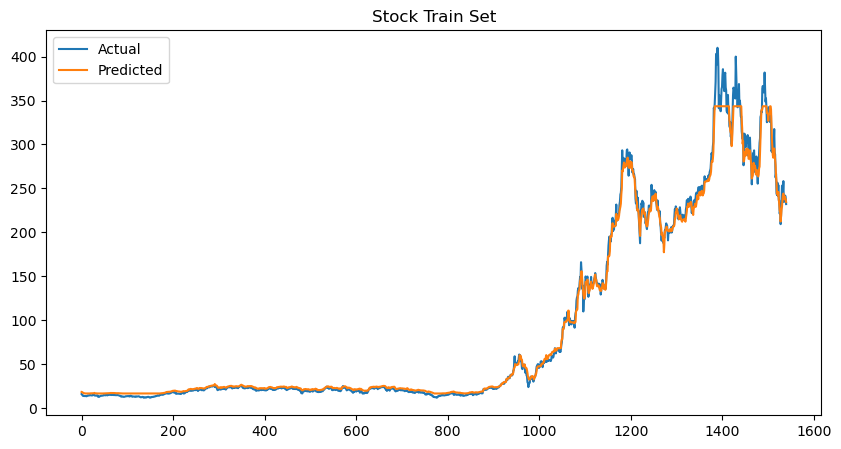

In [14]:
plt.figure(figsize=(10, 5))
plt.plot(y_train, label="Actual")
plt.plot(pred_train, label="Predicted")
plt.title(f"{selected_dataset} Train Set")
plt.legend()
plt.show()

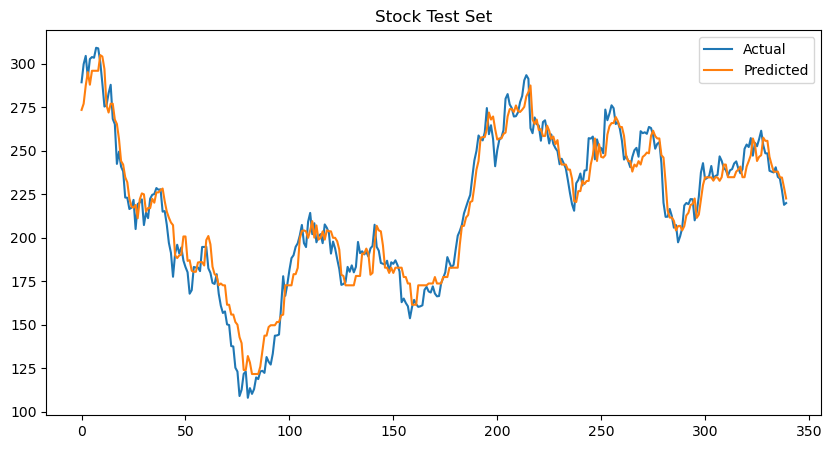

In [15]:
plt.figure(figsize=(10, 5))
plt.plot(y_test, label="Actual")
plt.plot(pred_test, label="Predicted")
plt.title(f"{selected_dataset} Test Set")
plt.legend()
plt.show()

In [16]:
model_rmses = []
for model in selected_models:
    with open(f"../{model}/RMSE_{model}.json", "r") as f:
        rmse_data = json.load(f)
    model_rmses.append(rmse_data[selected_dataset])

model_rmses.append(rmse_test)
labels = selected_models + ['Stacked Ensemble']

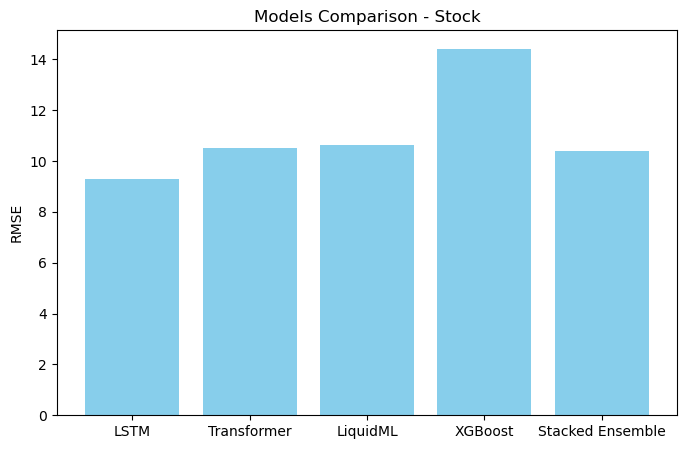

In [17]:
plt.figure(figsize=(8, 5))
plt.bar(labels, model_rmses, color='skyblue')
plt.title(f"Models Comparison - {selected_dataset}")
plt.ylabel("RMSE")
plt.show()